# Proyecto "Detección Automatizada de Malaria mediante Microscopía e Inteligencia Artificial"

- La malaria continúa siendo una de las principales enfermedades transmisibles a nivel mundial, afectando especialmente a regiones tropicales y subtropicales. Su diagnóstico preciso y oportuno es fundamental para el tratamiento eficaz y la reducción de la mortalidad. Tradicionalmente, la identificación de parásitos del género Plasmodium se realiza mediante el examen microscópico de frotis sanguíneos, un proceso que requiere experiencia, tiempo y recursos especializados.

- En este contexto, proponemos un nuevo marco de análisis denominado PlasmodiumVF-Net, diseñado para procesar imágenes de frotis gruesos obtenidas por microscopía y proporcionar un diagnóstico tanto a nivel de imagen como de paciente. Este sistema no solo detecta si un paciente está infectado, sino que, en caso de confirmarse la infección, identifica si se trata de Plasmodium falciparum o Plasmodium vivax.

- La arquitectura de PlasmodiumVF-Net combina múltiples etapas: primero detecta posibles parásitos mediante una Mask R-CNN, luego filtra falsos positivos con un clasificador basado en ResNet50, y finalmente determina la especie utilizando un método innovador que se apoya en el número de regiones detectadas y las probabilidades agregadas obtenidas de todas las imágenes de un paciente. Este enfoque resulta especialmente desafiante debido al reducido tamaño de los parásitos, su similitud con artefactos de tinción, la semejanza entre especies en diferentes etapas de desarrollo y las variaciones de iluminación o color.

- Para su desarrollo y validación, se utilizó un conjunto de datos manualmente anotado que comprende 350 pacientes y aproximadamente 6,000 imágenes, el cual se ha puesto a disposición pública junto con la investigación original. Los resultados obtenidos muestran una precisión global superior al 90% tanto a nivel de imagen como de paciente, evidenciando el potencial de este enfoque como herramienta de apoyo en el diagnóstico automatizado de la malaria.

### Dataset: 
- Diagnosing Malaria Patients with Plasmodium falciparum and vivax Using Deep Learning for Thick Smear Images
- https://pmc.ncbi.nlm.nih.gov/articles/PMC8621537/

---
## Preparación del Dataset

- Cargar imágenes en un DataFrame con su respectiva anotación y etiqueta (infectado/no_infectado).
- Convertir las imágenes a tensores y normalizarlas.
- Dividir el dataset en entrenamiento, validación y test.

## Preprocesamiento

- Ajustar tamaño de las imágenes (por ejemplo, a 224x224 para usar modelos preentrenados como ResNet, VGG).
- Codificar las etiquetas (infectado=1, no_infectado=0).

## Definición del Modelo

- Usar TensorFlow/Keras.
- Definir una CNN desde cero.

## Entrenamiento

- Entrenar el modelo CNN con las imágenes.
- Visualizar métricas (precisión, pérdida) por época.

## Evaluación

- Evaluar en el conjunto de test.
- Mostrar ejemplos de predicciones correctas e incorrectas.

### VALIDACION DEL DATASET CON LAS IMAGENES Y LAS ANOTACIONES
### CADA IMAGEN TIENE SU PROPIA ANOTACION Y SU PROPIA ETIQUETA IDENTIFICANDO LAS CELULAS INFECTADAS Y LAS NO INFECTADAS

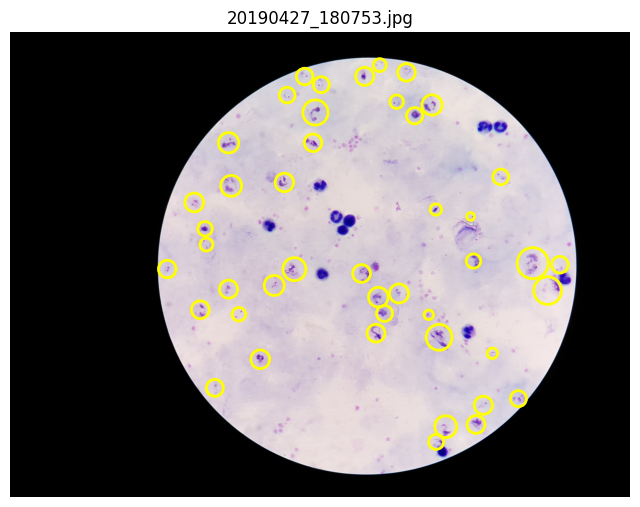

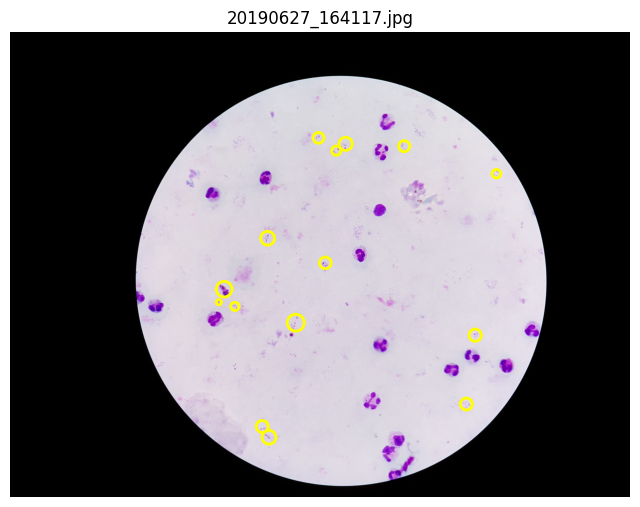

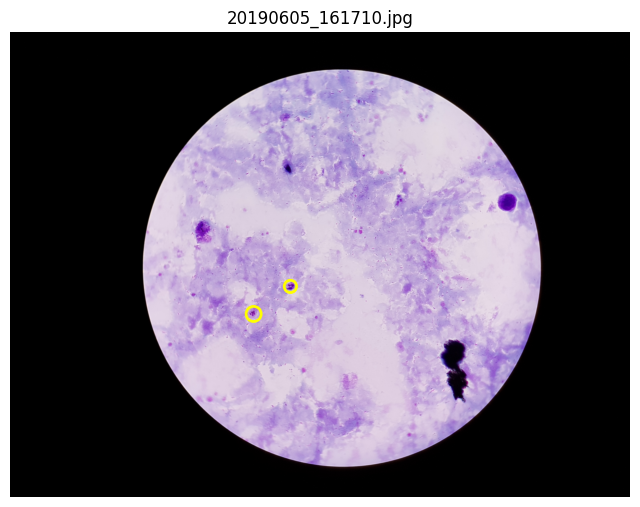

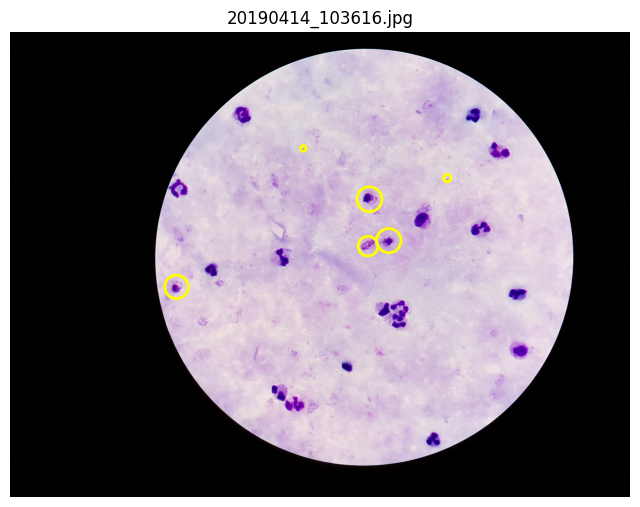

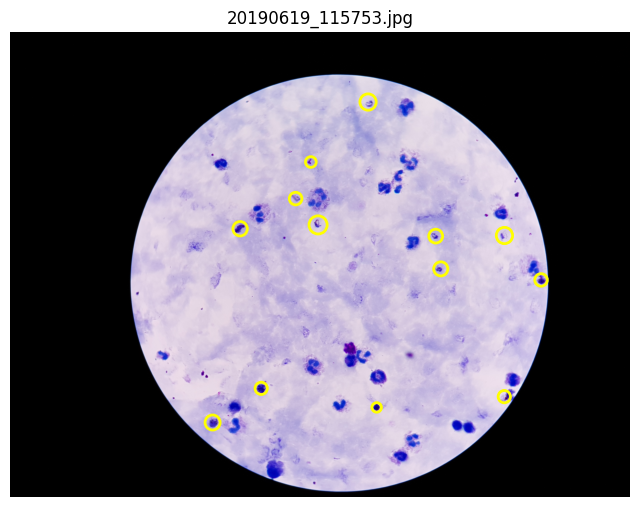

In [1]:
import os  # Módulo para interactuar con el sistema de archivos (rutas, carpetas, etc.)
import random  # Módulo para seleccionar elementos de manera aleatoria
import matplotlib.pyplot as plt  # Librería para generar gráficos y mostrar imágenes
import matplotlib.patches as patches  # Módulo para dibujar formas (círculos, rectángulos, etc.) sobre las imágenes
from PIL import Image  # Librería Pillow para abrir y manipular imágenes
import numpy as np  # Librería para cálculos numéricos y operaciones matemáticas

# Ruta base donde se encuentran las imágenes
img_base = './dataset/infectados/All_PvTK'
# Ruta base donde se encuentran las anotaciones correspondientes a las imágenes
annot_base = './dataset/infectados/All_annotations'

# Lista que almacenará pares de (ruta_imagen, ruta_anotación)
image_annotation_pairs = []

# Recorre todas las carpetas de pacientes en la carpeta base de imágenes
for patient_folder in os.listdir(img_base):
    # Ruta completa a la carpeta de imágenes del paciente
    img_folder = os.path.join(img_base, patient_folder)
    # Ruta completa a la carpeta de anotaciones del paciente
    annot_folder = os.path.join(annot_base, patient_folder)

    # Si alguna de las carpetas no existe o no es un directorio, pasa al siguiente
    if not os.path.isdir(img_folder) or not os.path.isdir(annot_folder):
        continue

    # Recorre todos los archivos en la carpeta de imágenes
    for filename in os.listdir(img_folder):
        # Verifica si el archivo es una imagen con extensión válida
        if filename.lower().endswith(('.tiff', '.png', '.jpg', '.jpeg')):
            # Ruta completa de la imagen
            img_path = os.path.join(img_folder, filename)
            # Nombre base del archivo sin extensión
            base_name = os.path.splitext(filename)[0]

            # Posibles nombres que podría tener el archivo de anotación
            possible_annot_names = [
                base_name + '.txt',  # Mismo nombre que la imagen
                base_name.replace('_', '') + '.txt'  # Variante sin guiones bajos
            ]

            found_annot = None  # Variable para guardar la ruta de la anotación encontrada

            # Busca si alguna de las posibles anotaciones existe
            for annot_name in possible_annot_names:
                annot_path = os.path.join(annot_folder, annot_name)
                if os.path.exists(annot_path):
                    found_annot = annot_path
                    break  # Detener la búsqueda al encontrar la anotación

            # Si se encontró una anotación válida, almacenar el par (imagen, anotación)
            if found_annot:
                image_annotation_pairs.append((img_path, found_annot))

# Selecciona aleatoriamente 5 pares de imagen-anotación para mostrar
sampled_pairs = random.sample(image_annotation_pairs, 5)

# Recorre cada par seleccionado
for img_path, annot_path in sampled_pairs:
    # Abre la imagen usando Pillow
    img = Image.open(img_path)
    # Crea una figura y un eje para dibujar
    fig, ax = plt.subplots(1, figsize=(8, 8))
    # Muestra la imagen en el eje
    ax.imshow(img)

    # Abre el archivo de anotación
    with open(annot_path, 'r') as f:
        # Lee todas las líneas excepto la primera (generalmente contiene metadatos)
        lines = f.readlines()[1:]
        # Recorre cada línea de anotación
        for i, line in enumerate(lines):
            # Reemplaza comas por espacios y divide en columnas
            cols = line.strip().replace(',', ' ').split()

            # Verifica que haya al menos 9 columnas en la línea
            if len(cols) >= 9:
                try:
                    # Extrae las coordenadas del centro y el borde del círculo
                    x_center = float(cols[5])
                    y_center = float(cols[6])
                    x_edge = float(cols[7])
                    y_edge = float(cols[8])

                    # Calcula el radio del círculo usando la distancia entre centro y borde
                    radius = np.sqrt((x_edge - x_center) ** 2 + (y_edge - y_center) ** 2)

                    # Crea un círculo amarillo sin relleno
                    circ = patches.Circle((x_center, y_center), radius,
                                          linewidth=2, edgecolor='yellow', facecolor='none')

                    # Agrega el círculo al gráfico
                    ax.add_patch(circ)
                except ValueError:
                    # Si hay datos inválidos en la línea, muestra un mensaje de error
                    print(f"Coordenadas inválidas en línea {i+1}: '{line.strip()}'")
            else:
                # Si la línea no tiene el número de columnas esperado, muestra advertencia
                print(f"Línea no válida (esperado ≥9 columnas): '{line.strip()}'")

    # Título de la imagen con el nombre del archivo
    plt.title(os.path.basename(img_path))
    # Quita los ejes de la figura
    plt.axis('off')
    # Muestra la imagen con sus anotaciones
    plt.show()


### Esta parte del código es un visualizador de anotaciones de imágenes para el dataset de malaria.
#### Para los archivo y emparejamiento de la informacion
- Recorre las carpetas de imágenes y anotaciones
- Filtra solo archivos de imagen (.tiff, .png, .jpg, .jpeg).
- Busca en la ruta ./dataset/infectados/All_PvTK todas las carpetas de pacientes.
- Para cada paciente, busca la carpeta equivalente en ./dataset/infectados/All_annotations donde están los archivos .txt con las anotaciones.
- Empareja imágenes con sus anotaciones
- Busca el archivo de anotación que tenga el mismo nombre que la imagen (o el mismo nombre pero sin guiones bajos).
- Si lo encuentra, guarda el par (ruta_imagen, ruta_anotación) en una lista.
- Seleccionar un subconjunto aleatorio para mostrar
#### Para cada línea de anotación:
- Obtiene las coordenadas del centro (x_center, y_center) y de un punto del borde (x_edge, y_edge).
- Calcula el radio del círculo usando la distancia entre el centro y el borde.
- Dibuja un círculo amarillo sin relleno sobre la imagen para marcar la zona anotada.
#### Mostrar resultados
- Muestra la imagen en pantalla con los círculos de anotación y sin ejes, para que solo se vea la imagen limpia.

---
# Proyecto "Detección Automatizada de Malaria mediante Microscopía e Inteligencia Artificial"
---

## LIBRERIAS NECESARIAS PARA EL PROYECTO

In [2]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping

## Preparación del Dataset

- Cargar imágenes en un DataFrame con su respectiva anotación y etiqueta (infectado/no_infectado).
- Convertir las imágenes a tensores y normalizarlas.
- Dividir el dataset en entrenamiento, validación y test.

In [3]:
# Definir el tamaño estándar de las imágenes (ancho, alto) para el procesamiento posterior
IMG_SIZE = (224, 224)
# Número de imágenes que se procesarán por lote durante el entrenamiento o evaluación
BATCH_SIZE = 32
# Función para recopilar información del dataset de imágenes y sus anotaciones
def gather_dataset_info(root_dir, dataset_name, annotations_folder, images_folder, label, tiled_subfolder=False):
    # Ruta a la carpeta de anotaciones
    annotations_dir = os.path.join(root_dir, dataset_name, annotations_folder)
    # Ruta a la carpeta de imágenes
    images_dir = os.path.join(root_dir, dataset_name, images_folder)
    # Función auxiliar para obtener imágenes que están en subcarpeta 'tiled'
    def get_images_tiled(folder):
        file_paths = []
        # Recorre las carpetas dentro
        for foldername in os.listdir(folder):
            folder_path = os.path.join(folder, foldername)
            tiled_path = os.path.join(folder_path, 'tiled')  # Subcarpeta donde están las imágenes divididas
            if os.path.exists(tiled_path):
                # Recorre todos los archivos en la carpeta 'tiled'
                for file in os.listdir(tiled_path):
                    # Filtra solo imágenes con extensiones válidas
                    if file.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.tif')):
                        file_paths.append(os.path.join(tiled_path, file))
        return file_paths
    # Función auxiliar para obtener imágenes de forma recursiva en la carpeta (sin subcarpeta 'tiled')
    def get_images_normal(folder):
        file_paths = []
        # os.walk recorre carpeta y subcarpetas
        for root, _, files in os.walk(folder):
            for file in files:
                # Filtra solo imágenes con extensiones válidas
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.tif')):
                    file_paths.append(os.path.join(root, file))
        return file_paths
    # Según el parámetro 'tiled_subfolder', decide qué método usar para obtener las imágenes
    image_files = get_images_tiled(images_dir) if tiled_subfolder else get_images_normal(images_dir)
    # Lista para guardar la información de cada imagen
    data = []
    # Recorre cada imagen encontrada
    for img_path in image_files:
        # Obtiene el nombre del archivo sin extensión
        filename_wo_ext = os.path.splitext(os.path.basename(img_path))[0]
        annotation_file = None
        annotation_text = None
        # Busca el archivo de anotación con el mismo nombre en la carpeta de anotaciones
        for root, _, files in os.walk(annotations_dir):
            if filename_wo_ext + '.txt' in files:
                annotation_file = os.path.join(root, filename_wo_ext + '.txt')
                break
        # Si no encontró la anotación, intenta con el nombre sin guiones bajos
        if annotation_file is None:
            alt_filename = filename_wo_ext.replace('_', '')
            for root, _, files in os.walk(annotations_dir):
                if alt_filename + '.txt' in files:
                    annotation_file = os.path.join(root, alt_filename + '.txt')
                    break
        # Si se encontró archivo de anotación, leer su contenido
        if annotation_file:
            with open(annotation_file, 'r') as f:
                annotation_text = f.read().strip()  # Elimina espacios o saltos de línea extra
        # Agregar la información como un diccionario
        data.append({
            'image_path': img_path,                # Ruta completa de la imagen
            'annotation': annotation_text,         # Texto de la anotación (o None si no se encontró)
            'label': 1 if label == 'infectado' else 0  # Etiqueta binaria (1=infectado, 0=no infectado)
        })
    # Retorna la información en un DataFrame de pandas
    return pd.DataFrame(data)
# Directorio base donde están los datasets
base_dir = './dataset'
# Recopila información de las imágenes infectadas
df_infectados = gather_dataset_info(base_dir, 'infectados', 'All_annotations', 'All_PvTK', 'infectado')
# Recopila información de las imágenes no infectadas (estas tienen subcarpetas 'tiled')
df_no_infectados = gather_dataset_info(base_dir, 'no_infectados', 'Annotations', 'imgPatients', 'no_infectado', tiled_subfolder=True)
# Une ambos DataFrames en uno solo
df_total = pd.concat([df_infectados, df_no_infectados], ignore_index=True)
# Muestra el total de imágenes y la cantidad por clase
print("Total de imágenes:", len(df_total))
print("Imágenes infectadas:", len(df_total[df_total['label'] == 1]))
print("Imágenes no infectadas:", len(df_total[df_total['label'] == 0]))


Total de imágenes: 4155
Imágenes infectadas: 3014
Imágenes no infectadas: 1141


In [4]:
df_total

,image_path,annotation,label
0,./dataset\infectados\All_PvTK\PvTk1\20190404_1...,"24,4032,3024\n9-1,Parasitized,No_Comment,Circl...",1
1,./dataset\infectados\All_PvTK\PvTk1\20190404_1...,"20,4032,3024\n8-1,Parasitized,No_Comment,Circl...",1
2,./dataset\infectados\All_PvTK\PvTk1\20190404_1...,"19,4032,3024\n10-1,Parasitized,No_Comment,Circ...",1
3,./dataset\infectados\All_PvTK\PvTk1\20190404_1...,"16,4032,3024\n11-1,Parasitized,No_Comment,Circ...",1
4,./dataset\infectados\All_PvTK\PvTk1\20190404_1...,"25,4032,3024\n1-1,Parasitized,No_Comment,Circl...",1
...,...,...,...
4150,./dataset\no_infectados\imgPatients\TF250_W9B5...,"21,4032,3024\n24-1,White_Blood_Cell,No_Comment...",0
4151,./dataset\no_infectados\imgPatients\TF250_W9B5...,"21,4032,3024\n25-1,White_Blood_Cell,No_Comment...",0
4152,./dataset\no_infectados\imgPatients\TF250_W9B5...,"25,4032,3024\n26-1,White_Blood_Cell,No_Comment...",0
4153,./dataset\no_infectados\imgPatients\TF250_W9B5...,"19,4032,3024\n27-1,White_Blood_Cell,No_Comment...",0


## VERIFICACION DE ANOTACIONES PARA CADA IMAGEN

In [5]:
# Inicializar contador de filas sin anotación válida
contador_sin_anotacion = 0

# Recorrer cada fila de df_total
for _, row in df_total.iterrows():
    # Verificar si la columna 'annotation' es nula o vacía (después de quitar espacios)
    if pd.isnull(row['annotation']) or row['annotation'].strip() == '':
        contador_sin_anotacion += 1

# Mostrar el total de filas sin anotación válida
print(f"Total de filas sin anotación válida: {contador_sin_anotacion}")

Total de filas sin anotación válida: 0


## Definición del Modelo

- Usar TensorFlow/Keras.
- Definir una CNN desde cero.

In [6]:
# División del DataFrame total en entrenamiento, validación y prueba

# train_df: 70% de los datos (estratificado para mantener proporción de clases)
# temp_df: 30% de los datos restantes, que luego se dividirán en validación y prueba
train_df, temp_df = train_test_split(
    df_total,                  # Dataset completo
    test_size=0.3,              # 30% para validación + prueba
    stratify=df_total['label'], # Mantener proporción de clases igual en cada conjunto
    random_state=42             # Semilla fija para reproducibilidad
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df['label'],   # Mantener proporción de clases
    random_state=42              # Semilla fija para reproducibilidad
)

# Función para procesar una imagen desde su ruta
def process_path(file_path, label):
    # Convierte el tensor de ruta a string normal en Python
    file_path = file_path.numpy().decode('utf-8')
    # Abre la imagen, la convierte a RGB y la redimensiona al tamaño definido (IMG_SIZE)
    img = Image.open(file_path).convert('RGB').resize(IMG_SIZE)
    # Convierte la imagen a arreglo NumPy con valores entre 0 y 1
    img = np.array(img, dtype=np.float32) / 255.0
    # Convierte la etiqueta a entero de 32 bits
    label = np.int32(label)
    return img, label

# Función equivalente a process_path, pero adaptada para usarse en pipelines de TensorFlow
def tf_process_path(file_path, label):
    # Llama a process_path desde TensorFlow usando py_function para ejecutar código Python
    result = tf.py_function(
        func=process_path,             # Función Python a ejecutar
        inp=[file_path, label],        # Entradas: ruta del archivo y etiqueta
        Tout=[tf.float32, tf.int32]    # Tipos de salida: imagen (float32) y etiqueta (int32)
    )
    img = result[0]  # Imagen procesada
    lbl = result[1]  # Etiqueta

    # Define explícitamente la forma (shape) de la imagen: ancho, alto y 3 canales (RGB)
    img.set_shape([IMG_SIZE[0], IMG_SIZE[1], 3])
    # Define que la etiqueta es un único valor escalar
    lbl.set_shape([])

    return img, lbl  # Retorna imagen y etiqueta procesadas



## Entrenamiento

- Entrenar el modelo CNN con las imágenes.
- Visualizar métricas (precisión, pérdida) por época.
- Conversion a dataframes para poder ser utilizado en el analisis de los datos


In [7]:
# Convierte un DataFrame con rutas de imágenes y etiquetas en un tf.data.Dataset procesado
def df_to_dataset(df):
    # Extrae las rutas de las imágenes del DataFrame como un array de NumPy
    paths = df['image_path'].values
    # Extrae las etiquetas (0 o 1) del DataFrame
    labels = df['label'].values
    
    # Crea un dataset de TensorFlow a partir de las rutas y etiquetas
    path_ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    
    # Aplica la función tf_process_path a cada elemento para cargar y procesar las imágenes
    # num_parallel_calls=tf.data.AUTOTUNE optimiza la carga en paralelo
    image_label_ds = path_ds.map(tf_process_path, num_parallel_calls=tf.data.AUTOTUNE)
    
    # Devuelve el dataset ya mapeado a imágenes y etiquetas
    return image_label_ds

# Prepara el dataset de entrenamiento:
# - Mezcla aleatoriamente hasta 1000 elementos (shuffle)
# - Agrupa en lotes del tamaño definido (BATCH_SIZE)
# - Prefetch: carga lotes en memoria mientras se entrena para acelerar
train_ds = df_to_dataset(train_df).shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Dataset de validación:
# - No se hace shuffle para mantener el orden
# - Se agrupa en lotes y se optimiza con prefetch
val_ds = df_to_dataset(val_df).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Dataset de prueba (igual que validación)
test_ds = df_to_dataset(test_df).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Definición de un modelo CNN sencillo con Keras
model = models.Sequential([
    # Capa de entrada con tamaño definido de imagen y 3 canales (RGB)
    tf.keras.Input(shape=(*IMG_SIZE, 3)),
    
    # Primera capa convolucional: 32 filtros 3x3 con activación ReLU
    layers.Conv2D(32, (3,3), activation='relu'),
    # MaxPooling reduce la resolución a la mitad
    layers.MaxPooling2D(2,2),
    
    # Segunda capa convolucional: 64 filtros 3x3 con activación ReLU
    layers.Conv2D(64, (3,3), activation='relu'),
    # MaxPooling reduce la resolución
    layers.MaxPooling2D(2,2),
    
    # Convierte la salida 2D en un vector 1D
    layers.Flatten(),
    
    # Capa densa totalmente conectada con 128 neuronas
    layers.Dense(128, activation='relu'),
    
    # Capa de salida: 1 neurona con activación sigmoide (clasificación binaria)
    layers.Dense(1, activation='sigmoid')
])

# Compila el modelo:
# - Optimizador Adam
# - Función de pérdida binaria (porque la salida es 0 o 1)
# - Métrica de evaluación: exactitud
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Muestra la arquitectura y el número de parámetros
model.summary()



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 186624)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    23,888,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,907,521 (91.20 MB)

 Trainable params: 23,907,521 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
# Definir la técnica de Early Stopping para detener el entrenamiento si la validación no mejora
early_stop = EarlyStopping(
    monitor='val_loss',          # Monitorea la pérdida en el conjunto de validación
    patience=3,                  # Espera 3 épocas sin mejora antes de detener el entrenamiento
    restore_best_weights=True    # Al finalizar, restaura los pesos del modelo con la mejor validación
)

# Establecer el número máximo de épocas para el entrenamiento
EPOCHS = 4

# Entrenar el modelo con el conjunto de entrenamiento y validación, aplicando Early Stopping
history = model.fit(
    train_ds,                   # Dataset de entrenamiento
    validation_data=val_ds,     # Dataset de validación
    epochs=EPOCHS,              # Número máximo de épocas
    callbacks=[early_stop]      # Lista de callbacks, en este caso Early Stopping
)

# Evaluar el modelo final en el conjunto de prueba para obtener métricas de desempeño
loss, accuracy = model.evaluate(test_ds)

# Mostrar la precisión obtenida en el conjunto de prueba, formateada a 2 decimales
print(f'Test accuracy: {accuracy:.2f}')

Epoch 1/4
91/91 ━━━━━━━━━━━━━━━━━━━━ 101s 880ms/step - accuracy: 0.9192 - loss: 0.7515 - val_accuracy: 0.9904 - val_loss: 0.0297
Epoch 2/4
91/91 ━━━━━━━━━━━━━━━━━━━━ 93s 828ms/step - accuracy: 0.9972 - loss: 0.0060 - val_accuracy: 0.9936 - val_loss: 0.0125
Epoch 3/4
91/91 ━━━━━━━━━━━━━━━━━━━━ 108s 959ms/step - accuracy: 1.0000 - loss: 3.2117e-04 - val_accuracy: 0.9952 - val_loss: 0.0079
Epoch 4/4
91/91 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 1.0000 - loss: 8.0763e-05 - val_accuracy: 0.9968 - val_loss: 0.0068
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 799ms/step - accuracy: 1.0000 - loss: 1.0732e-04
Test accuracy: 1.00


## Evaluación

- Evaluar en el conjunto de test.
- Mostrar ejemplos de predicciones correctas e incorrectas.

20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 592ms/step
              precision    recall  f1-score   support

No Infectado       1.00      1.00      1.00       171
   Infectado       1.00      1.00      1.00       453

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624



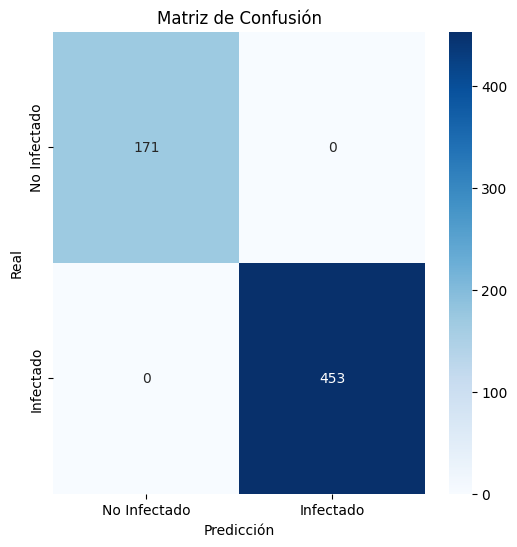

In [9]:
# Obtener las etiquetas verdaderas (ground truth) del dataset de prueba
# Se concatenan todas las etiquetas 'y' de cada lote (batch) en test_ds
y_true = np.concatenate([y for x, y in test_ds], axis=0)

# Obtener las probabilidades de predicción del modelo para el dataset de prueba
y_pred_probs = model.predict(test_ds)

# Convertir las probabilidades en etiquetas binarias (0 o 1) usando un umbral de 0.5
# Luego, aplanar el arreglo para que tenga una dimensión
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

# Imprimir el reporte de clasificación con métricas como precisión, recall y f1-score
# target_names asigna etiquetas legibles a las clases 0 y 1
print(classification_report(y_true, y_pred, target_names=['No Infectado', 'Infectado']))

# Calcular la matriz de confusión entre las etiquetas reales y las predichas
conf_mat = confusion_matrix(y_true, y_pred)

# Crear una figura para la visualización de la matriz de confusión
plt.figure(figsize=(6,6))

# Mostrar la matriz de confusión como un mapa de calor con anotaciones numéricas
# 'fmt="d"' indica que los valores serán enteros
# Los ejes se etiquetan con las clases correspondientes para facilitar interpretación
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['No Infectado', 'Infectado'], 
            yticklabels=['No Infectado', 'Infectado'])

# Etiquetas para los ejes X e Y
plt.xlabel('Predicción')
plt.ylabel('Real')

# Título del gráfico
plt.title('Matriz de Confusión')

# Mostrar el gráfico generado
plt.show()


In [10]:
print(classification_report(y_true, y_pred, target_names=['No Infectado', 'Infectado'], zero_division=0))


              precision    recall  f1-score   support

No Infectado       1.00      1.00      1.00       171
   Infectado       1.00      1.00      1.00       453

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624



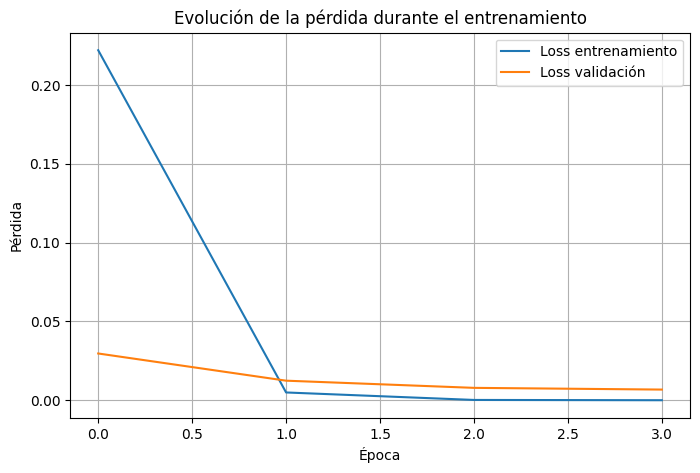

In [11]:
# Extraer las métricas de pérdida (loss) durante el entrenamiento y la validación desde el historial
loss = history.history['loss']         # Pérdida en cada época del conjunto de entrenamiento
val_loss = history.history['val_loss'] # Pérdida en cada época del conjunto de validación

# Crear una figura para el gráfico con tamaño personalizado
plt.figure(figsize=(8,5))

# Graficar la curva de pérdida del entrenamiento
plt.plot(loss, label='Loss entrenamiento')

# Graficar la curva de pérdida de la validación
plt.plot(val_loss, label='Loss validación')

# Etiqueta del eje X (número de épocas)
plt.xlabel('Época')

# Etiqueta del eje Y (valor de la pérdida)
plt.ylabel('Pérdida')

# Título del gráfico
plt.title('Evolución de la pérdida durante el entrenamiento')

# Mostrar la leyenda para distinguir las curvas
plt.legend()

# Activar la cuadrícula en el gráfico para mejor lectura
plt.grid(True)

# Mostrar el gráfico en pantalla
plt.show()


In [12]:
model.save("modelo_malaria.h5")

# EVALUACION EN IMAGENES CON DIAGNOSTICO ESTABLECIDO

In [ ]:
import os  # Módulo para manejar rutas y operaciones del sistema de archivos
import cv2  # Librería OpenCV para procesamiento de imágenes
import matplotlib.pyplot as plt  # Para crear gráficos e imágenes
import matplotlib.patches as patches  # Para dibujar formas (círculos, rectángulos) en imágenes
from tensorflow.keras.preprocessing import image  # Utilidades para preparar imágenes para redes neuronales
import numpy as np  # Para operaciones numéricas
from PIL import Image  # Para abrir y manipular imágenes

def mostrar_prediccion_y_anotacion_lado_a_lado(img_path, model, IMG_SIZE=(224, 224)):
    """
    Muestra una figura con dos paneles:
      1. Imagen original con anotaciones (círculos amarillos).
      2. Imagen redimensionada usada por el modelo, con la predicción y su probabilidad.
    Escala las coordenadas de las anotaciones si el tamaño de la imagen es diferente al usado originalmente.
    """

    # --- Preparar imagen para predicción ---
    img_for_model = cv2.imread(img_path)  # Lee la imagen desde la ruta en formato BGR
    img_rgb_resized = cv2.cvtColor(cv2.resize(img_for_model, IMG_SIZE), cv2.COLOR_BGR2RGB)  # Redimensiona y convierte a RGB
    img_array = image.img_to_array(img_rgb_resized) / 255.0  # Convierte a arreglo NumPy y normaliza valores (0-1)
    img_array = np.expand_dims(img_array, axis=0)  # Añade dimensión de batch (1, alto, ancho, canales)
    pred = model.predict(img_array)[0][0]  # Realiza predicción con el modelo y obtiene el primer valor
    pred_label = 'Infectado' if pred > 0.5 else 'No Infectado'  # Determina etiqueta según umbral de 0.5

    # --- Cargar imagen original para mostrar con anotaciones ---
    img_pil = Image.open(img_path)  # Abre imagen en formato PIL
    img_width, img_height = img_pil.size  # Obtiene dimensiones reales de la imagen

    # --- Buscar archivo de anotación correspondiente ---
    base_name = os.path.splitext(os.path.basename(img_path))[0]  # Extrae el nombre del archivo sin extensión
    possible_annot_names = [base_name + '.txt', base_name.replace('_', '') + '.txt']  # Posibles nombres de anotación
    found_annot = None  # Variable para guardar la ruta del archivo de anotación

    # Recorre todos los archivos de la carpeta de anotaciones buscando coincidencia
    for root, _, files in os.walk('./dataset/infectados/All_annotations'):
        for fname in files:
            if fname in possible_annot_names:  # Si el archivo encontrado coincide con un posible nombre
                found_annot = os.path.join(root, fname)  # Guarda la ruta completa
                break  # Sale del bucle interno
        if found_annot:  # Si ya encontró el archivo
            break  # Sale del bucle externo

    # --- Crear figura con dos subplots (lado a lado) ---
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))  # Crea figura con 1 fila y 2 columnas

    # Mostrar imagen original en el primer panel
    ax1.imshow(img_pil)  # Muestra imagen
    ax1.set_title("Imagen Original con Anotaciones")  # Título del subplot
    ax1.axis('off')  # Oculta ejes y ticks

    # --- Dibujar anotaciones si existen ---
    if found_annot:  # Si encontró archivo de anotación
        with open(found_annot, 'r') as f:  # Abre el archivo
            lines = f.readlines()[1:]  # Lee todas las líneas excepto la primera (cabecera)
            for i, line in enumerate(lines):  # Itera sobre cada línea
                cols = line.strip().replace(',', ' ').split()  # Limpia y separa valores por espacios
                if len(cols) >= 9:  # Verifica que tenga suficientes columnas
                    try:
                        # Coordenadas originales del círculo (en píxeles o escala original)
                        x_center_orig = float(cols[5])
                        y_center_orig = float(cols[6])
                        x_edge_orig = float(cols[7])
                        y_edge_orig = float(cols[8])

                        # Determina dimensiones de referencia (si están en el archivo)
                        ancho_ref = float(cols[1]) if cols[1].isdigit() else img_width
                        alto_ref = float(cols[2]) if cols[2].isdigit() else img_height

                        # Calcula factor de escala en X y Y
                        scale_x = img_width / ancho_ref
                        scale_y = img_height / alto_ref

                        # Aplica escala a las coordenadas para ajustarlas al tamaño actual
                        x_center = x_center_orig * scale_x
                        y_center = y_center_orig * scale_y
                        x_edge = x_edge_orig * scale_x
                        y_edge = y_edge_orig * scale_y

                        # Calcula radio del círculo usando distancia entre centro y borde
                        radius = np.sqrt((x_edge - x_center) ** 2 + (y_edge - y_center) ** 2)

                        # Crea círculo amarillo sin relleno
                        circ = patches.Circle(
                            (x_center, y_center), radius,
                            linewidth=2, edgecolor='yellow', facecolor='none'
                        )
                        ax1.add_patch(circ)  # Añade círculo al subplot
                    except ValueError:
                        print(f"Coordenadas inválidas: '{line.strip()}'")  # Mensaje de error si no puede convertir valores
    else:
        # Si no hay archivo de anotación, muestra texto en rojo
        ax1.text(0.5, 0.5, "No hay anotaciones disponibles", color='red',
                 fontsize=12, ha='center', va='center', transform=ax1.transAxes)

    # --- Mostrar imagen usada por el modelo en el segundo panel ---
    ax2.imshow(img_rgb_resized)  # Muestra imagen redimensionada
    ax2.set_title(f"Predicción: {pred_label}\nProbabilidad: {pred:.4f}")  # Título con predicción y probabilidad
    ax2.axis('off')  # Oculta ejes

    # Ajusta espaciado y muestra la figura
    plt.tight_layout()  # Ajusta disposición para que no se solapen
    plt.show()  # Muestra ventana con la figura


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


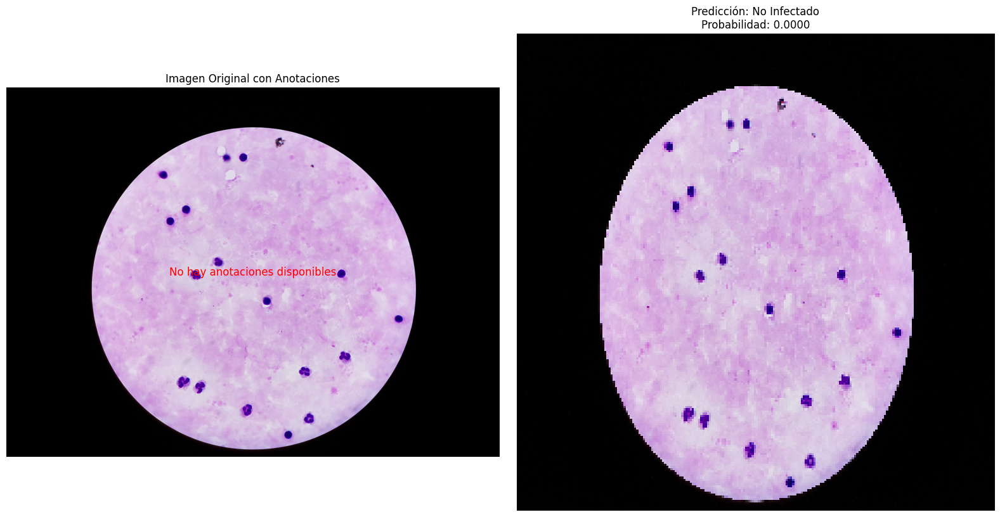

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


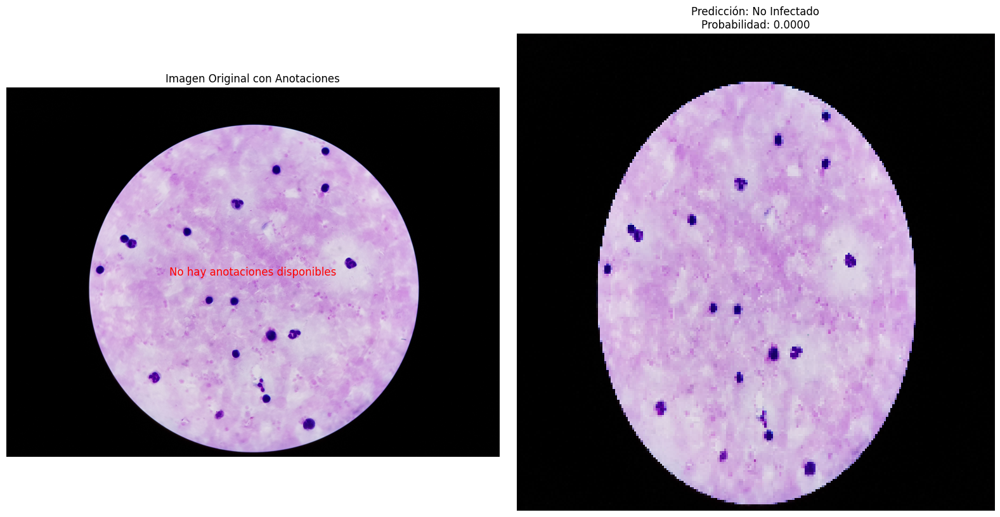

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


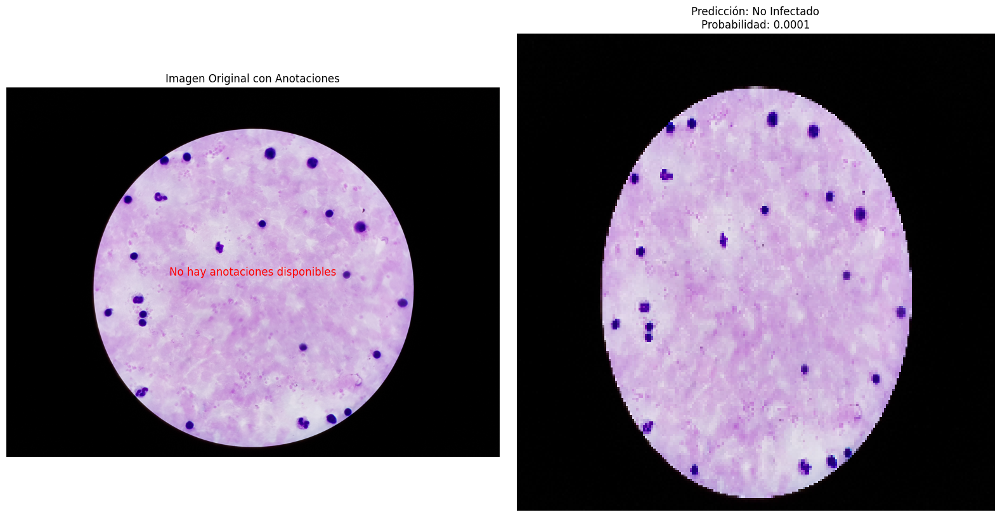

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


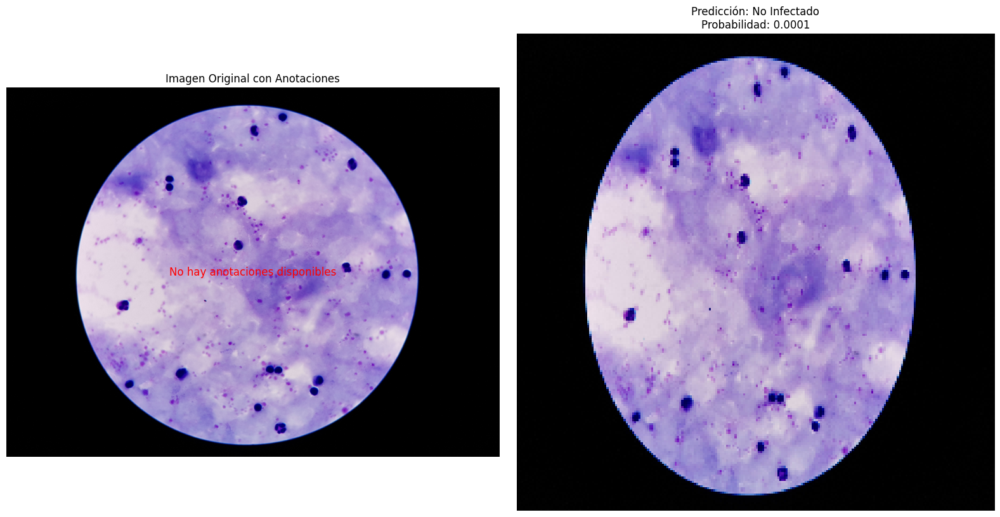

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


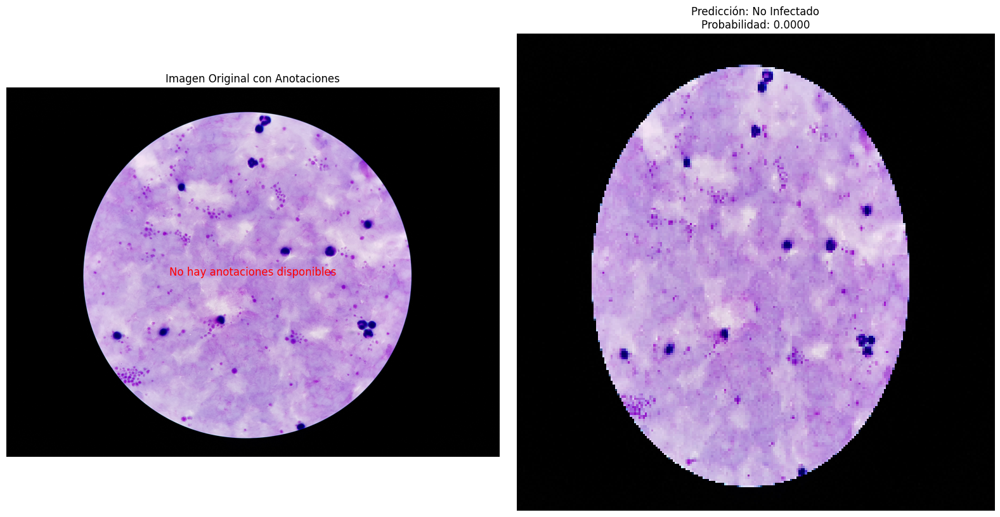

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


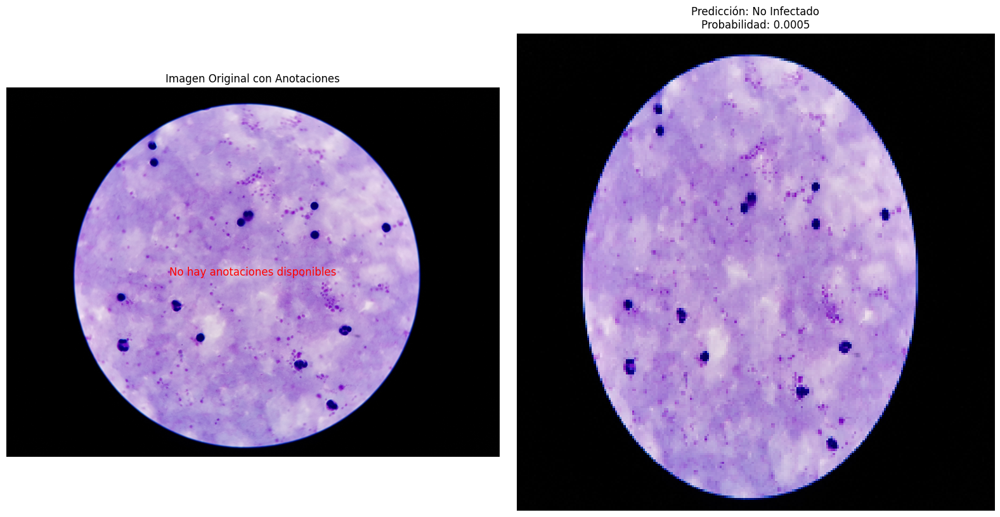

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


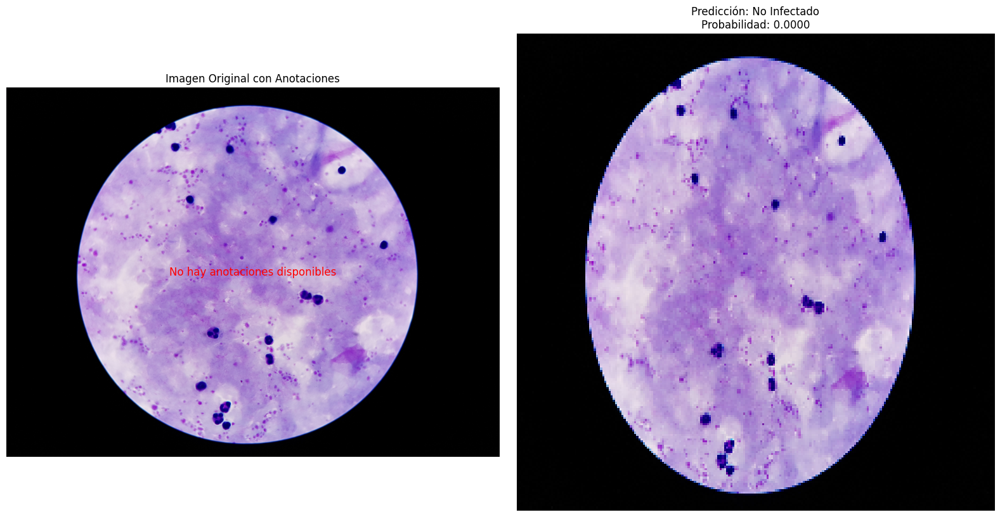

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


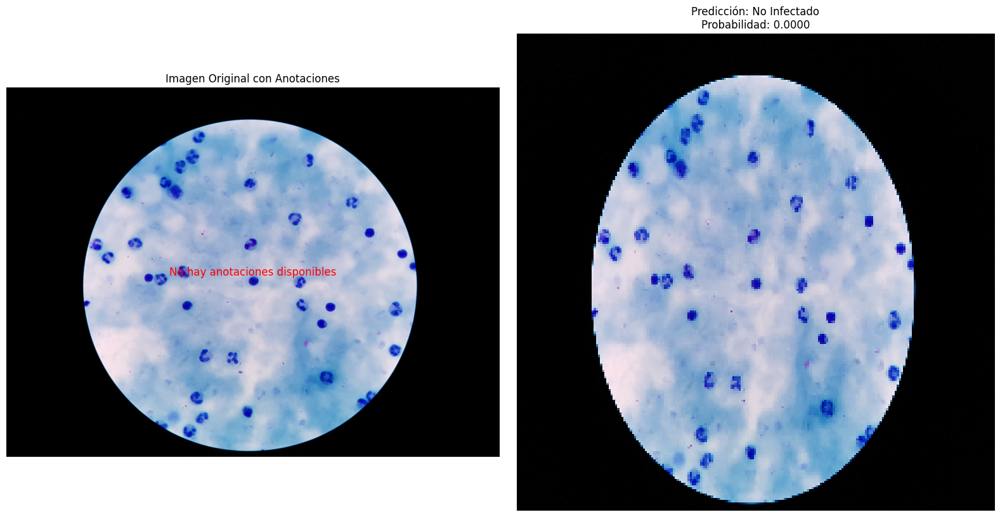

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


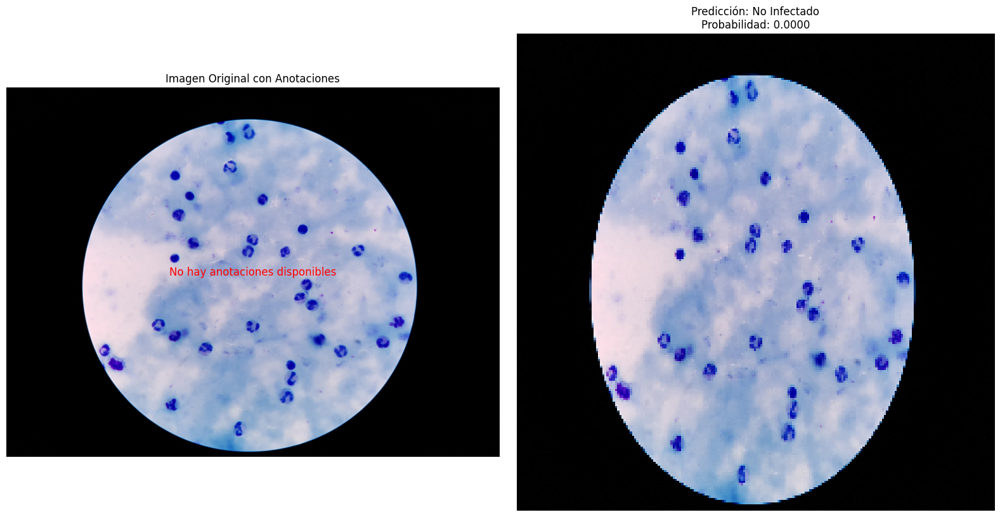

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


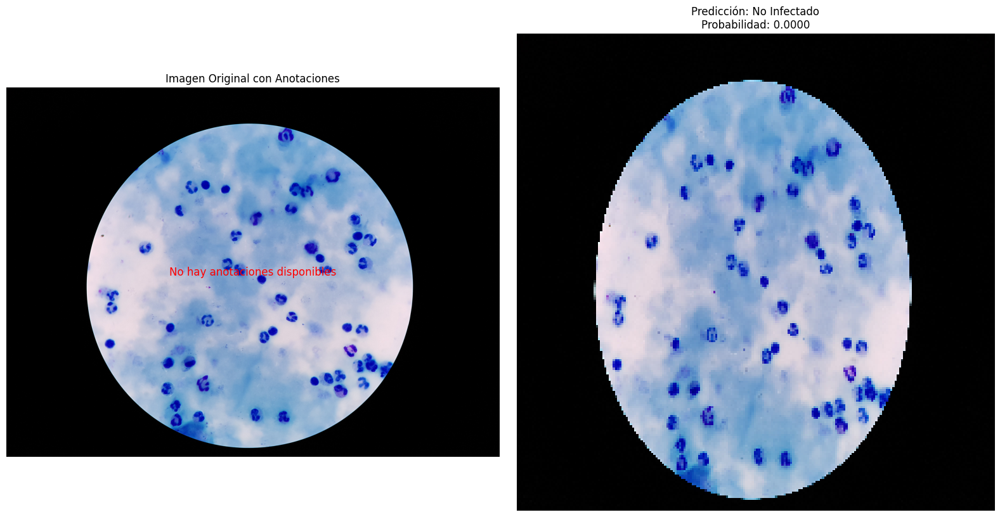

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


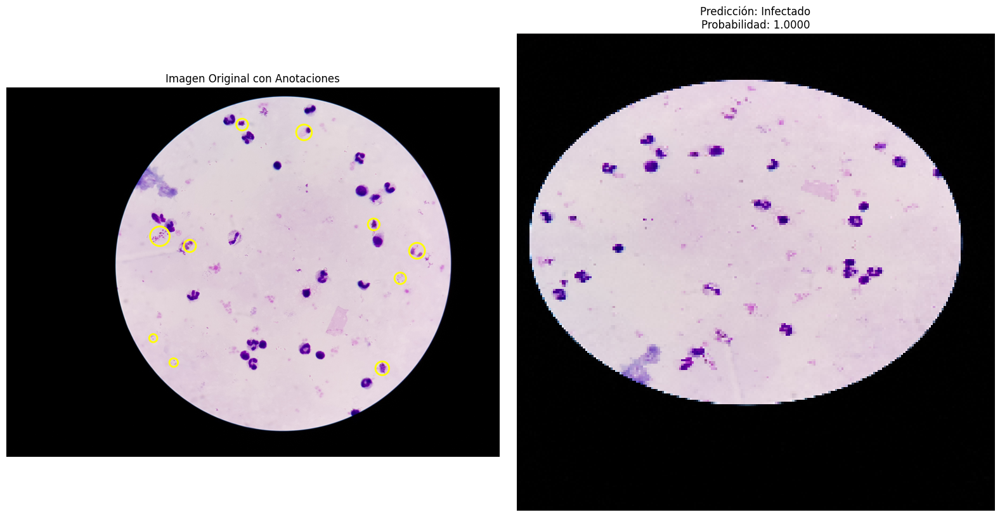

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


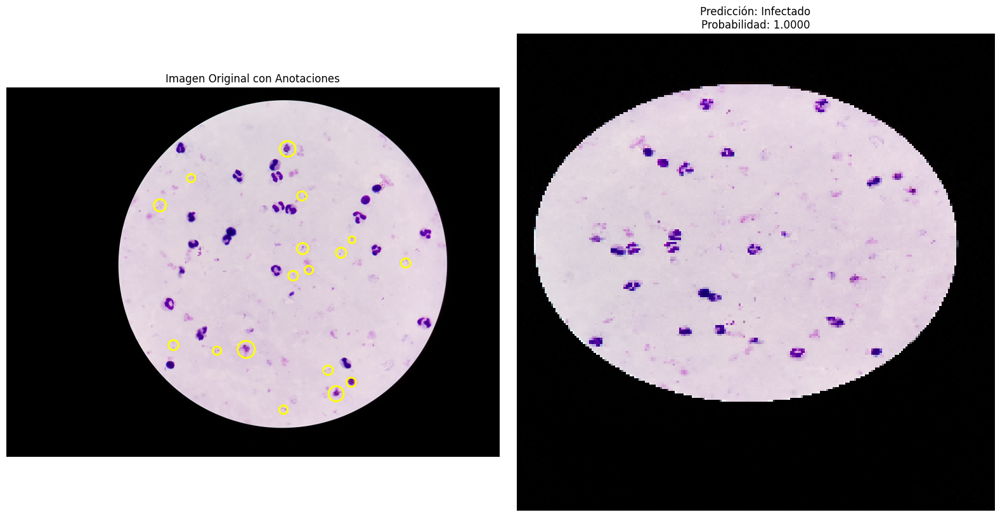

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


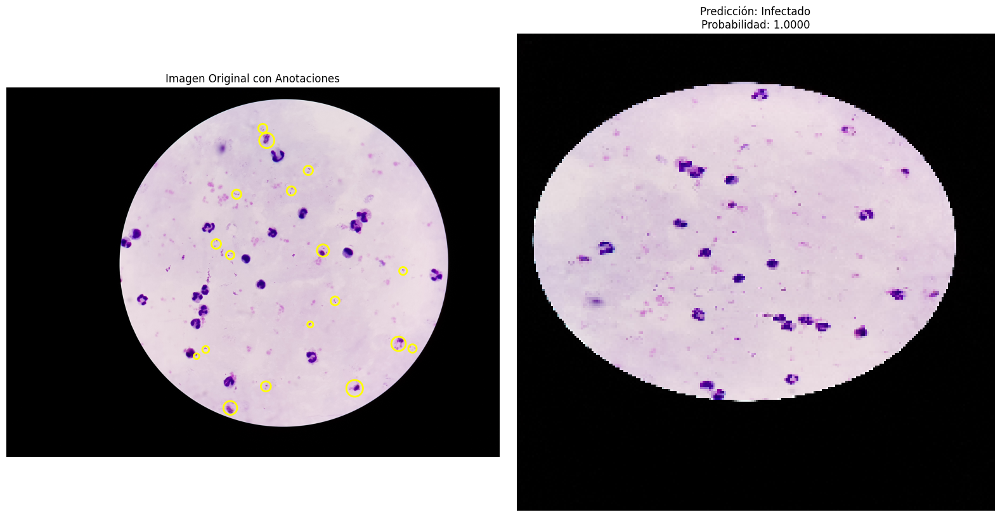

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


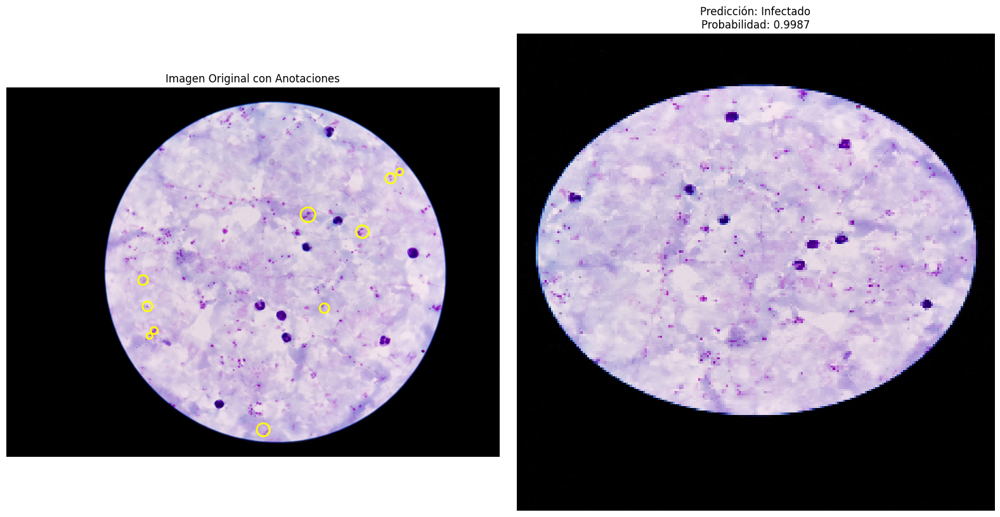

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


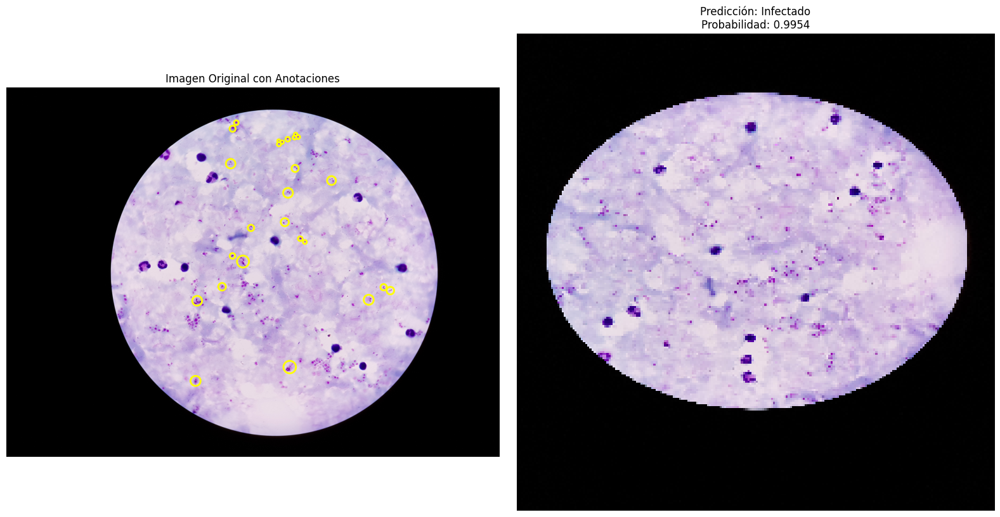

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


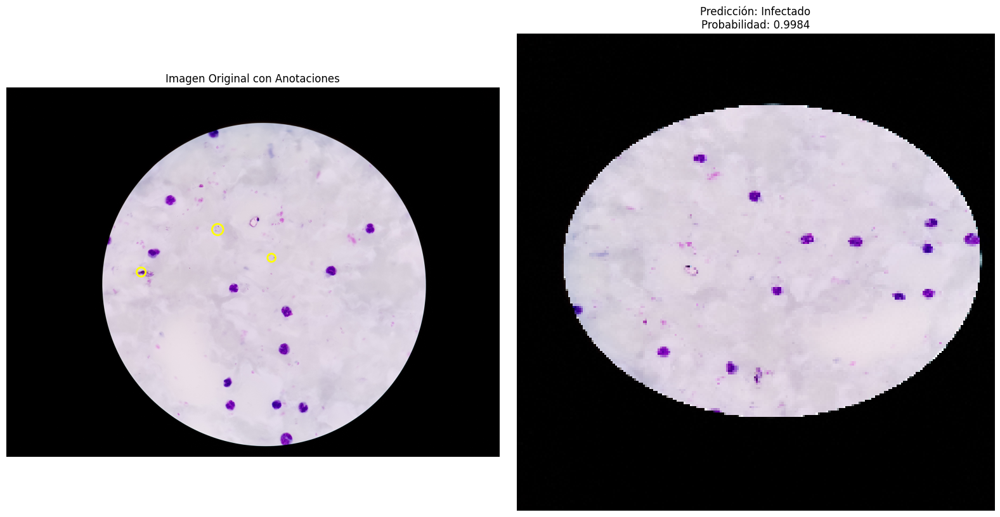

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


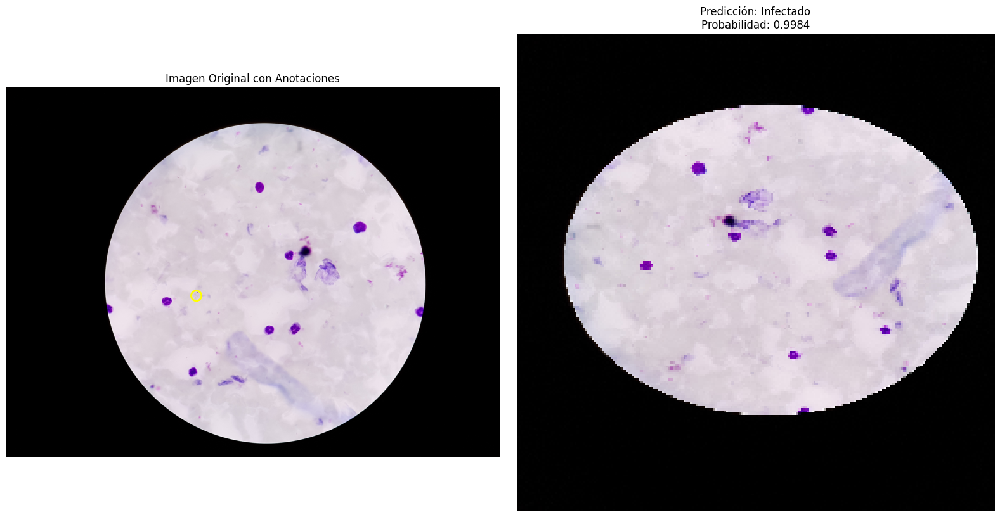

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


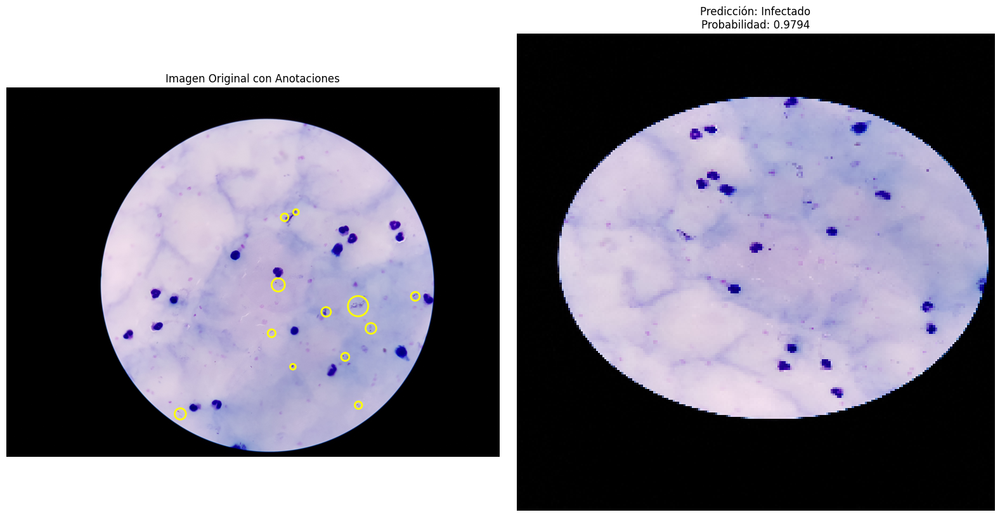

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


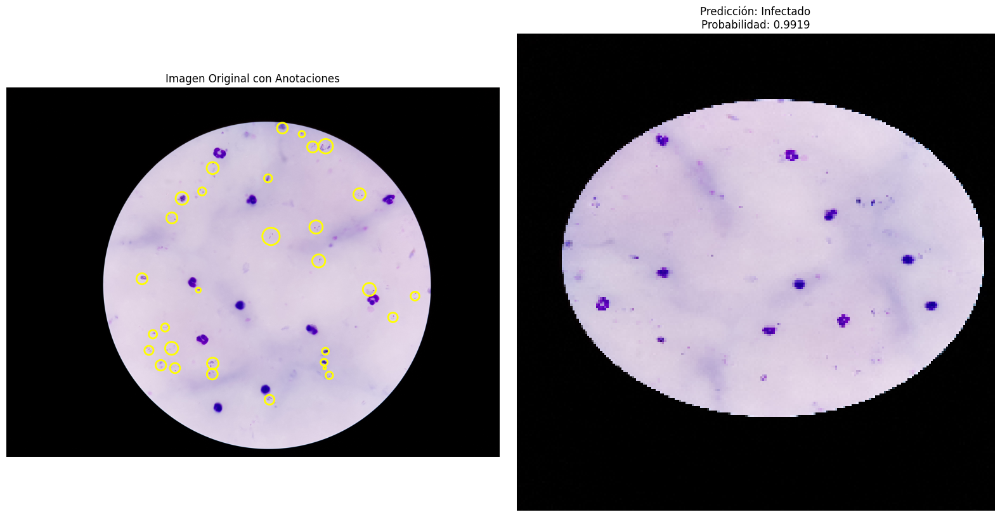

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


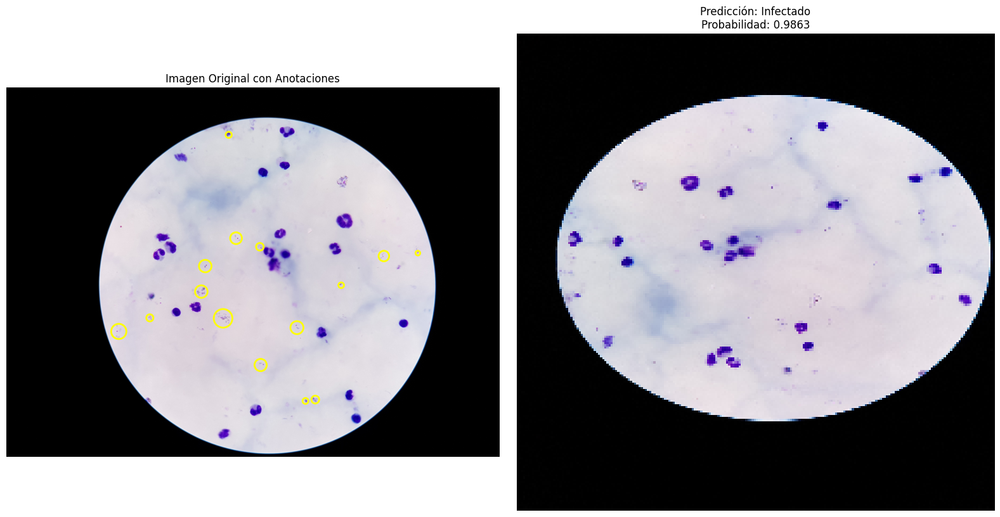

In [ ]:
from glob import glob  # Importa la función glob para buscar archivos con patrones
import os  # Módulo para manejar rutas y operaciones del sistema de archivos

# Ruta de la carpeta donde están las imágenes de prueba
pruebas_dir = './dataset/pruebas/'

# Obtiene una lista con todas las rutas de archivo dentro de 'pruebas_dir'
# El patrón '*' significa "todos los archivos" sin importar la extensión
image_files = glob(os.path.join(pruebas_dir, '*'))

# Recorre cada imagen encontrada en la carpeta
for img_path in image_files:
    # Llama a la función que muestra:
    # - Imagen original con anotaciones
    # - Imagen redimensionada para el modelo con la predicción
    mostrar_prediccion_y_anotacion_lado_a_lado(img_path, model)